# Notebook for prediction result analysis with figures

In [2]:
import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams["figure.dpi"]=300
import torch
import torch.nn.functional as F
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr,spearmanr

from src.utils import reconst_pair_idx
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    roc_curve,
    roc_auc_score
)
from sklearn.manifold import TSNE


In [3]:
seq_df = pd.read_csv("./data/human/gencode44_utr_gene_unique_cdhit09.csv",index_col=0)
print(len(seq_df))


16819


In [5]:
data_dir=f"./results/runs/multi_contrastive_each_species_out_feature_test"
score_path=os.path.join(data_dir,"score_dict.pkl")
preds_path=os.path.join(data_dir,"pred_results.pkl")
feat_path=os.path.join(data_dir,"output_features.pkl")

with open(score_path,"rb") as f:
    score=pickle.load(f)
with open(preds_path,"rb") as f:
    pred_results=pickle.load(f) # [cos_sim,logits,pair_idx]
with open(feat_path,"rb")as f:
    features=pickle.load(f)

print(score)
pair_idx = reconst_pair_idx(pred_results[-1])
logits=pred_results[1]
cos_sim=pred_results[0]


{'accuracy': 0.6469323394495413, 'precision': 0.6027777777777777, 'recall': 0.8682480708773935, 'f1': 0.711558730530507, 'confusion_matrix': array([[1475, 2002],
       [ 461, 3038]]), 'fpr_all': array([0.        , 0.        , 0.        , ..., 0.99942479, 0.9997124 ,
       1.        ]), 'tpr_all': array([0.00000000e+00, 2.85795942e-04, 5.71591883e-04, ...,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00]), 'roc_thresh': array([1.7242539 , 0.72425395, 0.7215564 , ..., 0.35535747, 0.35366264,
       0.35346392], dtype=float32), 'auc_roc': 0.7247738229658123}


In [6]:
h_size=len(seq_df) # human sample num
utr5_features=features[0].reshape(-1,512)
utr3_features=features[1].reshape(-1,512)


In [42]:
## pt1. divede → calculate
utr5_human = utr5_features[(pair_idx[:,-1]==1)&(pair_idx[:,0]<h_size)]
utr3_human = utr3_features[(pair_idx[:,-1]==1)&(pair_idx[:,0]<h_size)]

utr5_mouse = utr5_features[(pair_idx[:,-1]==1)&(pair_idx[:,0]>=h_size)]
utr3_mouse = utr3_features[(pair_idx[:,-1]==1)&(pair_idx[:,0]>=h_size)]

tsne=TSNE(n_components=2,random_state=1234)
utr5_human_tsne=tsne.fit_transform(utr5_human)
utr3_human_tsne=tsne.fit_transform(utr3_human)

utr5_mouse_tsne=tsne.fit_transform(utr5_mouse)
utr3_mouse_tsne=tsne.fit_transform(utr3_mouse)


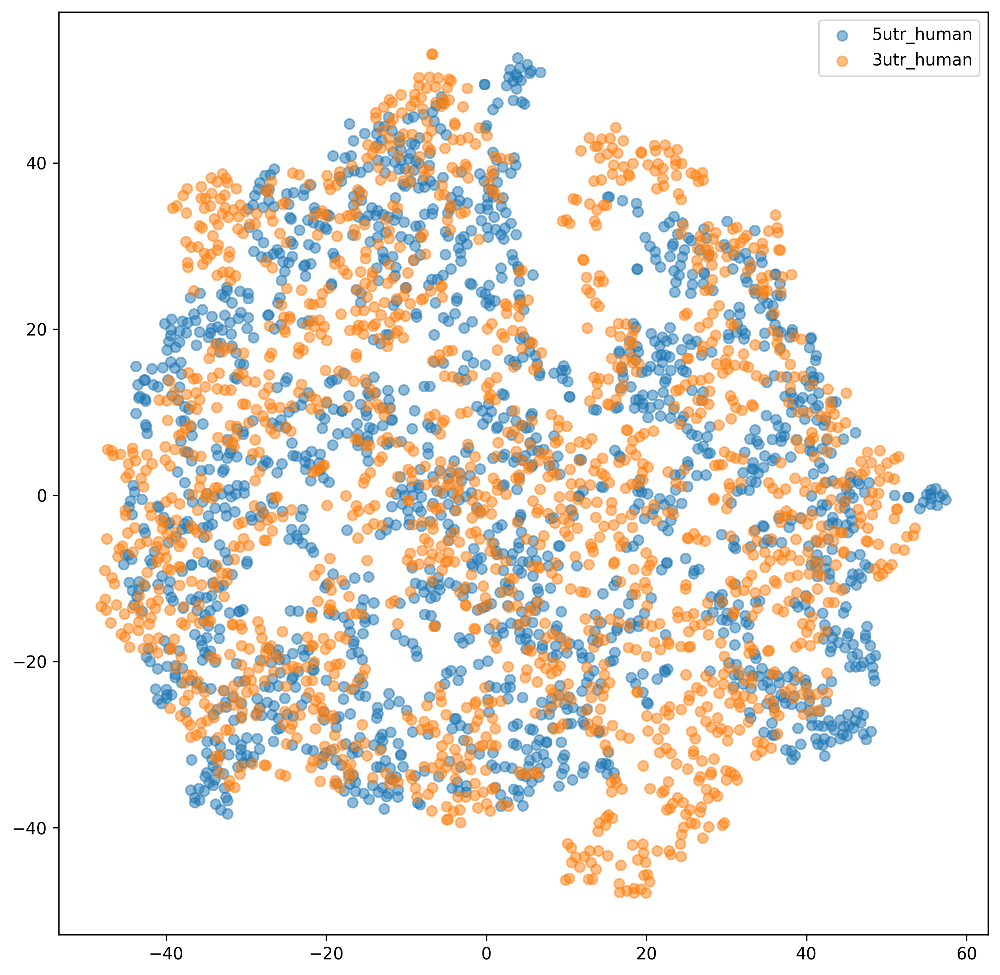

In [46]:
fig=plt.figure(figsize=(10,10))
plt.scatter(utr5_human_tsne[:,0],utr5_human_tsne[:,1],label="5utr_human",alpha=0.5)
plt.scatter(utr3_human_tsne[:,0],utr3_human_tsne[:,1],label="3utr_human",alpha=0.5)

#plt.scatter(utr5_mouse_tsne[:,0],utr5_mouse_tsne[:,1],label="5utr_mouse",alpha=0.5)
#plt.scatter(utr3_mouse_tsne[:,0],utr3_mouse_tsne[:,1],label="3utr_mouse",alpha=0.5)

plt.legend()


In [10]:
## pt2. calculate → devide
tsne=TSNE(n_components=2,random_state=1234)
utr5_tsne = tsne.fit_transform(utr5_features)
utr3_tsne= tsne.fit_transform(utr3_features)

utr5_human_tsne = utr5_tsne[(pair_idx[:,-1]==1)&(pair_idx[:,0]<h_size)]
utr3_human_tsne = utr3_tsne[(pair_idx[:,-1]==1)&(pair_idx[:,0]<h_size)]

utr5_mouse_tsne = utr5_tsne[(pair_idx[:,-1]==1)&(pair_idx[:,0]>=h_size)]
utr3_mouse_tsne = utr3_tsne[(pair_idx[:,-1]==1)&(pair_idx[:,0]>=h_size)]


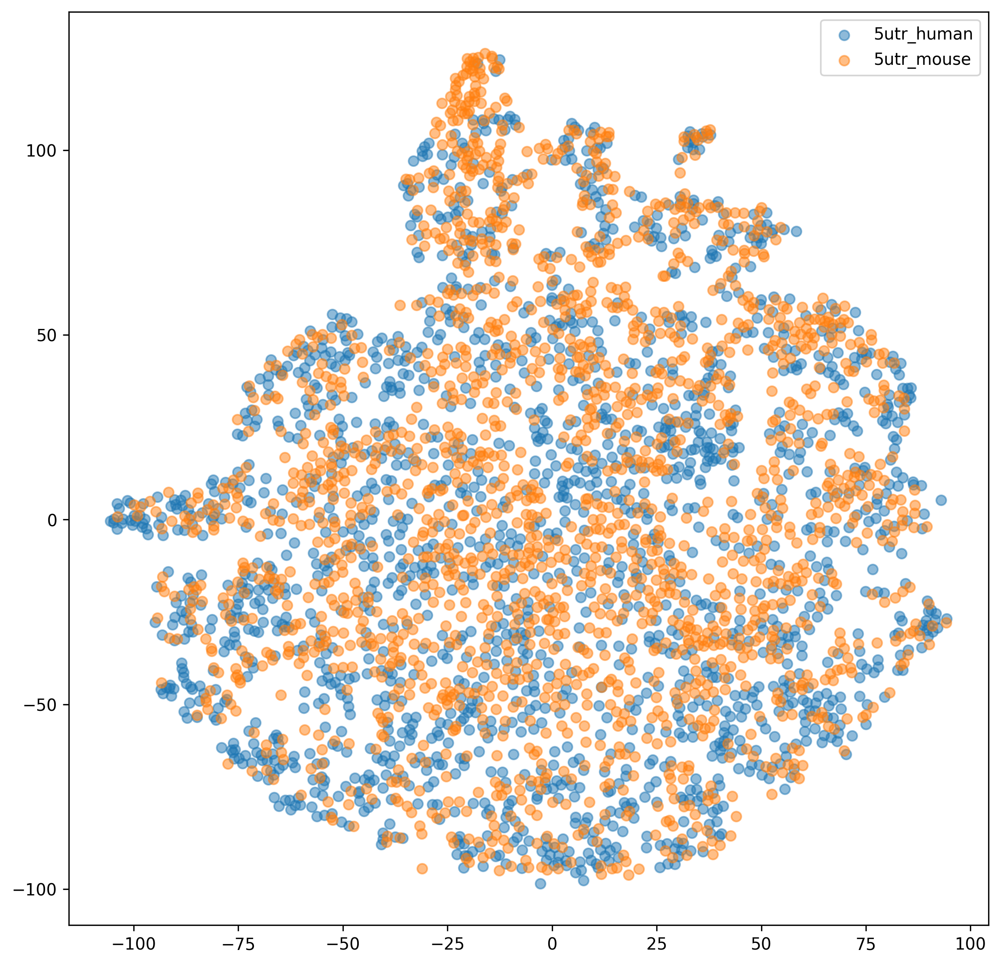

In [13]:
fig=plt.figure(figsize=(10,10))
plt.scatter(utr5_human_tsne[:,0],utr5_human_tsne[:,1],label="5utr_human",alpha=0.5)
#plt.scatter(utr3_human_tsne[:,0],utr3_human_tsne[:,1],label="3utr_human",alpha=0.5)

plt.scatter(utr5_mouse_tsne[:,0],utr5_mouse_tsne[:,1],label="5utr_mouse",alpha=0.5)
#plt.scatter(utr3_mouse_tsne[:,0],utr3_mouse_tsne[:,1],label="3utr_mouse",alpha=0.5)

plt.legend()


In [15]:
np.concatenate([utr5_features,utr3_features]).shape


(13952, 512)

In [7]:
## pt3. calculate → device → devide
tsne=TSNE(n_components=2,random_state=1234)
all_features=np.concatenate([utr5_features,utr3_features])
all_tsne = tsne.fit_transform(all_features)

utr5_tsne =  all_tsne[:len(utr5_features)]
utr3_tsne= all_tsne[len(utr5_features):]

utr5_human_tsne = utr5_tsne[(pair_idx[:,-1]==1)&(pair_idx[:,0]<h_size)]
utr3_human_tsne = utr3_tsne[(pair_idx[:,-1]==1)&(pair_idx[:,0]<h_size)]

utr5_mouse_tsne = utr5_tsne[(pair_idx[:,-1]==1)&(pair_idx[:,0]>=h_size)]
utr3_mouse_tsne = utr3_tsne[(pair_idx[:,-1]==1)&(pair_idx[:,0]>=h_size)]


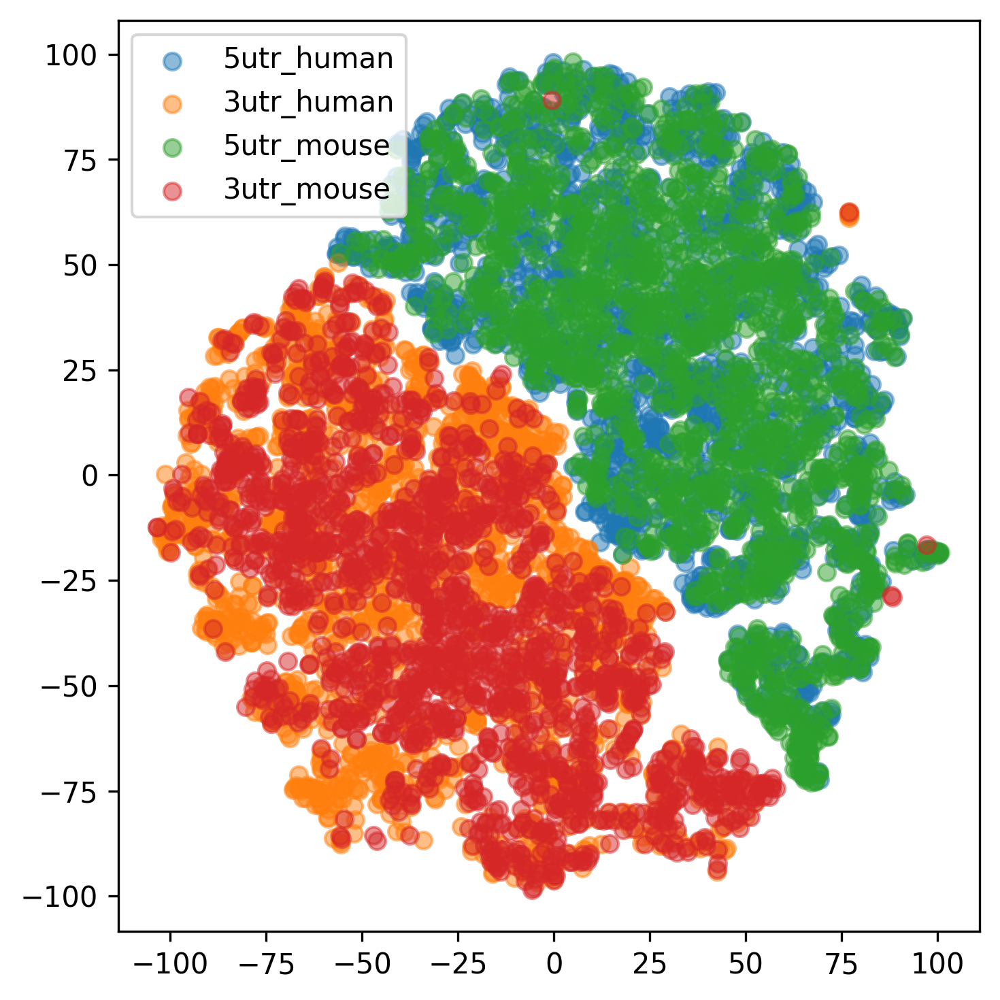

In [8]:
fig=plt.figure(figsize=(5,5))
plt.scatter(utr5_human_tsne[:,0],utr5_human_tsne[:,1],label="5utr_human",alpha=0.5)
plt.scatter(utr3_human_tsne[:,0],utr3_human_tsne[:,1],label="3utr_human",alpha=0.5)

plt.scatter(utr5_mouse_tsne[:,0],utr5_mouse_tsne[:,1],label="5utr_mouse",alpha=0.5)
plt.scatter(utr3_mouse_tsne[:,0],utr3_mouse_tsne[:,1],label="3utr_mouse",alpha=0.5)

plt.legend()
plt.tight_layout()
#plt.savefig("tsne_human_mouse")


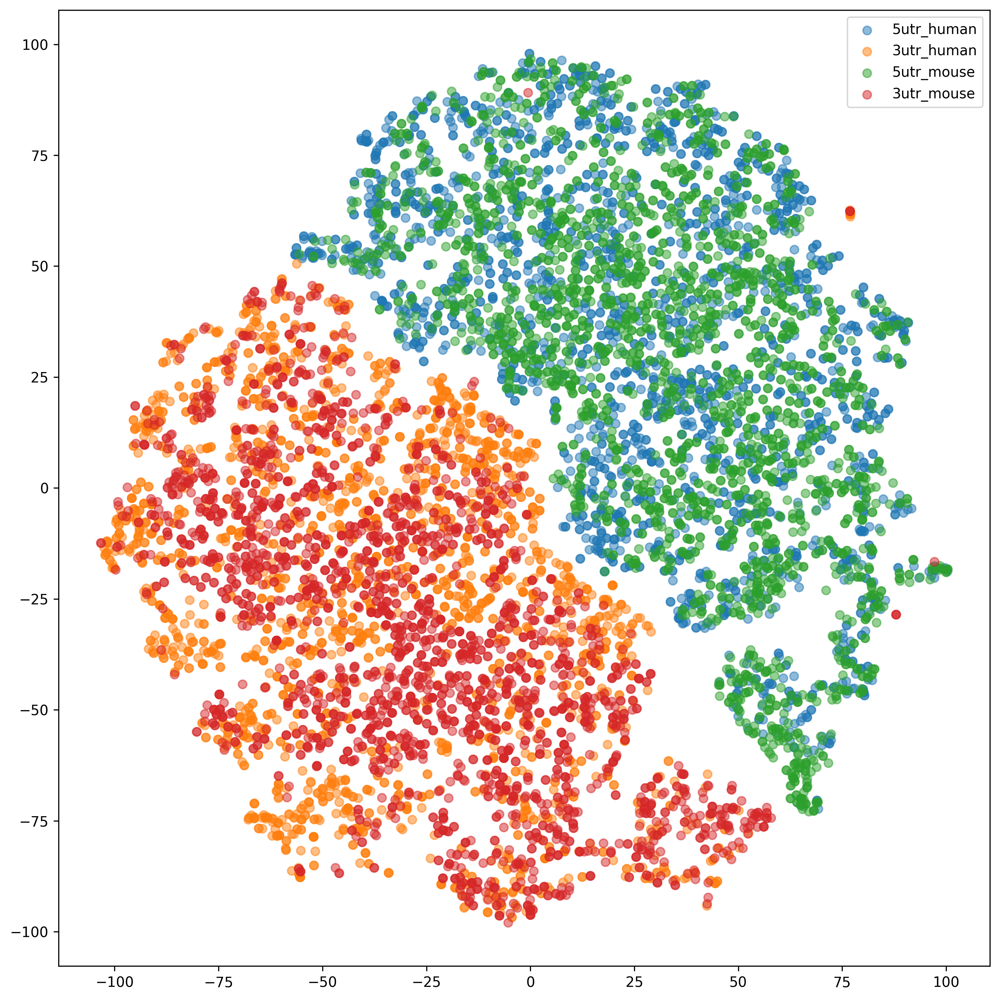

In [10]:
logit_thresh=0.5
utr5_human_tsne = utr5_tsne[(pair_idx[:,0]<h_size)&(logits>logit_thresh)]
utr3_human_tsne = utr3_tsne[(pair_idx[:,0]<h_size)&(logits>logit_thresh)]

utr5_mouse_tsne = utr5_tsne[(pair_idx[:,0]>=h_size)&(logits>logit_thresh)]
utr3_mouse_tsne = utr3_tsne[(pair_idx[:,0]>=h_size)&(logits>logit_thresh)]

fig=plt.figure(figsize=(10,10))
plt.scatter(utr5_human_tsne[:,0],utr5_human_tsne[:,1],label="5utr_human",alpha=0.5)
plt.scatter(utr3_human_tsne[:,0],utr3_human_tsne[:,1],label="3utr_human",alpha=0.5)

plt.scatter(utr5_mouse_tsne[:,0],utr5_mouse_tsne[:,1],label="5utr_mouse",alpha=0.5)
plt.scatter(utr3_mouse_tsne[:,0],utr3_mouse_tsne[:,1],label="3utr_mouse",alpha=0.5)

plt.legend()
plt.tight_layout()
#plt.savefig("tsne_human_mouse")
